## Objectif : classification de caractères, avec extraction de features, visualisation de features, et analyse des features maps

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from sklearn.preprocessing import StandardScaler
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import cv2


2025-02-20 09:28:34.137507: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-20 09:28:34.174679: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-20 09:28:34.458346: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-20 09:28:34.459763: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-20 09:28:35.418793: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not fin

In [5]:
def load_and_preprocess_images(folder_path, target_size=(224, 224)):
    model = VGG16(weights='imagenet', include_top=False)
    feature_list = []
    image_paths = []

    for subdir, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('png', 'jpg', 'jpeg')):
                img_path = os.path.join(subdir, file)
                img = image.load_img(img_path, target_size=target_size)
                img_array = image.img_to_array(img)
                img_array = np.expand_dims(img_array, axis=0)
                img_array = preprocess_input(img_array)

                features = model.predict(img_array).flatten()
                feature_list.append(features)
                image_paths.append(img_path)

    return np.array(feature_list), image_paths


def reduce_dimensionality(features, n_components=2):
    pca = PCA(n_components=n_components)
    features_pca = pca.fit_transform(features)
    return features_pca, pca


def cluster_images(features_pca, method='kmeans', n_clusters=5):
    if method == 'kmeans':
        model = KMeans(n_clusters=n_clusters, random_state=42)
    elif method == 'dbscan':
        model = DBSCAN(eps=5, min_samples=2)

    labels = model.fit_predict(features_pca)
    return labels

In [6]:
def plot_scatter(features_2d, labels):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='tab10', alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


def plot_scatter_with_images(features_2d, image_paths, zoom=0.1):
    fig, ax = plt.subplots(figsize=(15, 10))
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.scatter(features_2d[:, 0], features_2d[:, 1], alpha=0)

    for xy, img_path in zip(features_2d, image_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (150, 150))
        imagebox = OffsetImage(img, zoom=zoom)
        ab = AnnotationBbox(imagebox, xy, frameon=False)
        ax.add_artist(ab)

    plt.show()

In [7]:
folder_path = "/home/cvidalgo/Documents/cours/2024-03-22/data/mnist_test"

features, image_paths = load_and_preprocess_images(folder_path)

features_pca, pca = reduce_dimensionality(features)

1/1 [==============================] - 0s 144ms/step


In [8]:
for layer in model.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


In [9]:
labels = cluster_images(features_pca, method='kmeans', n_clusters=5)

/home/cvidalgo/miniconda3/envs/research/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [10]:
features_pca

array([[ -84.68493 ,  113.69261 ],
       [-289.7524  ,  342.78476 ],
       [-119.00955 ,  149.72249 ],
       ...,
       [ 359.32178 ,  -42.390514],
       [ 556.5721  ,   -9.765238],
       [ 565.311   ,  -30.671772]], dtype=float32)

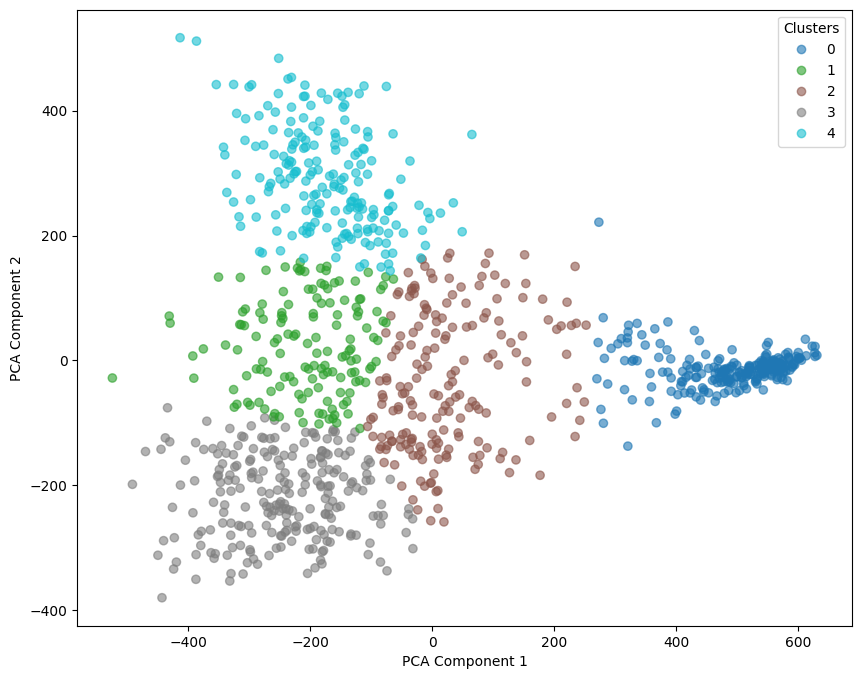

In [11]:
plot_scatter(features_pca, labels)

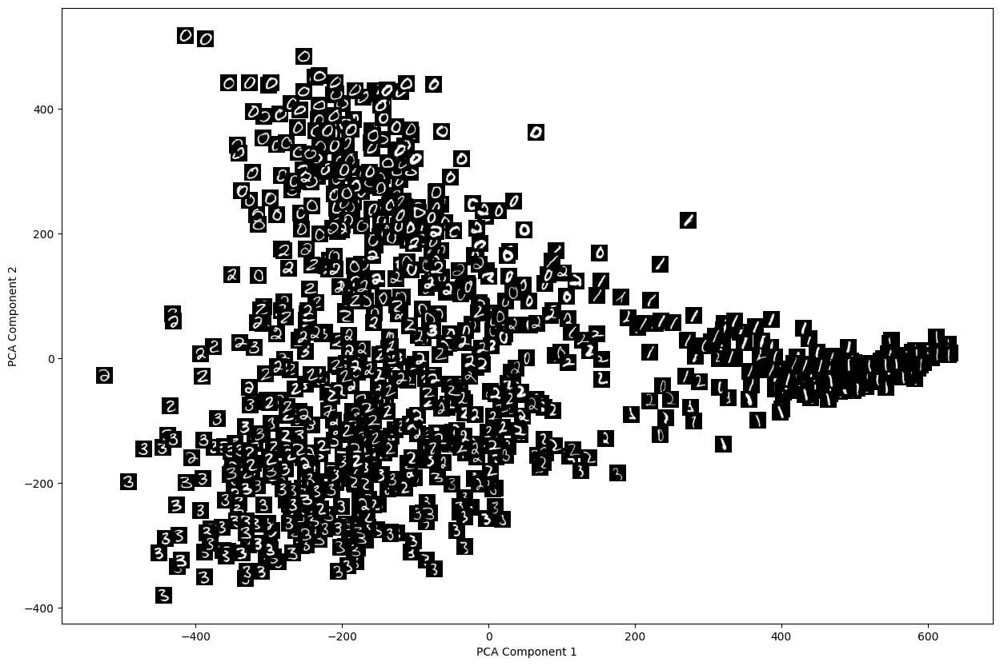

In [12]:
plot_scatter_with_images(features_pca, image_paths)

In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import cv2

def visualize_heatmap(model, image_paths, target_size=(224, 224)):
    intermediate_layer_model = Model(inputs=model.input, outputs=model.get_layer('block5_conv3').output)
    
    for img_path in image_paths[:5]:  # Visualize for first 5 images
        img = image.load_img(img_path, target_size=target_size)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        features = intermediate_layer_model.predict(img_array)
        heatmap = np.mean(features[0], axis=-1)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

        plt.figure(figsize=(8, 6))
        plt.imshow(superimposed_img)
        plt.axis("off")
        plt.title(f"Heatmap for {os.path.basename(img_path)}")
        plt.show()

1/1 [==============================] - 0s 151ms/step


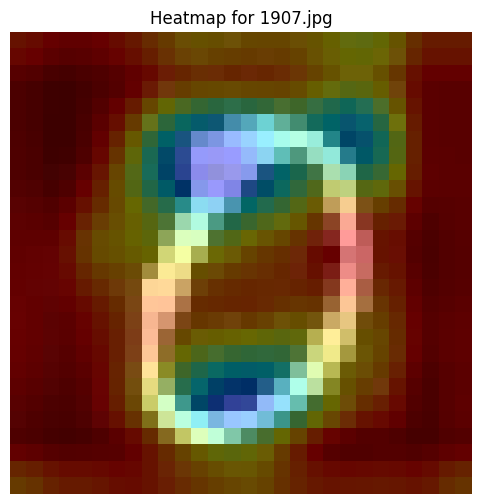

1/1 [==============================] - 0s 90ms/step


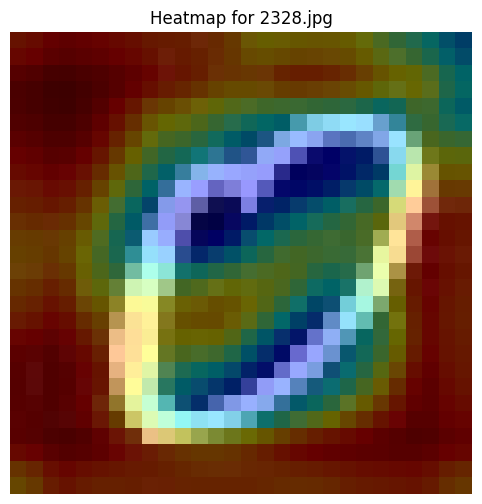

1/1 [==============================] - 0s 92ms/step


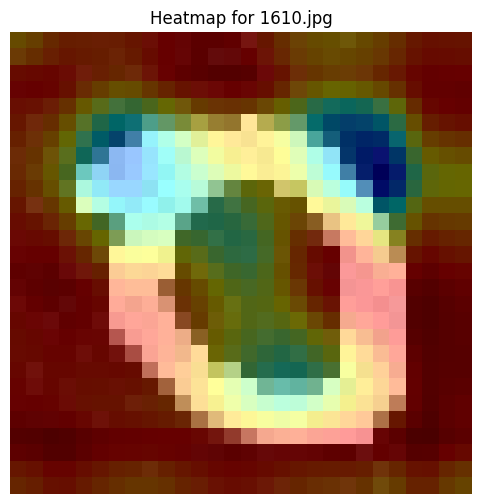

1/1 [==============================] - 0s 91ms/step


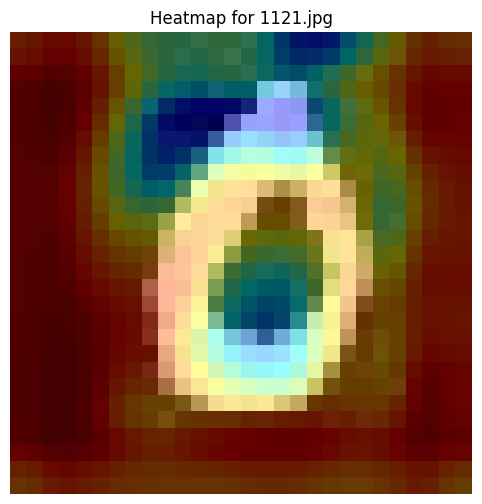

1/1 [==============================] - 0s 90ms/step


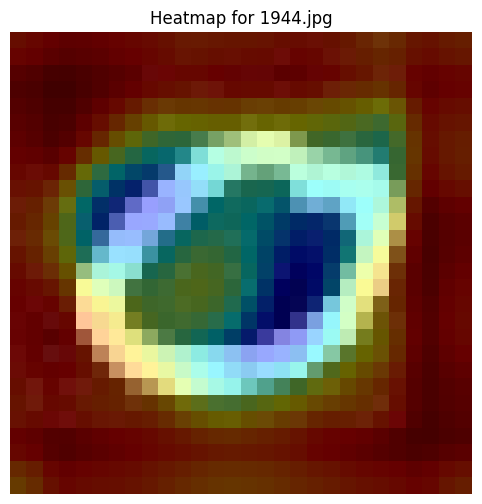

In [23]:
model = VGG16(weights='imagenet', include_top=False)
visualize_heatmap(model, image_paths)

Epoch 1/10
45/45 [==============================] - 32s 708ms/step - loss: 3.5993 - accuracy: 0.0453 - val_loss: 3.3959 - val_accuracy: 0.1170
Epoch 2/10
45/45 [==============================] - 34s 754ms/step - loss: 2.5817 - accuracy: 0.3213 - val_loss: 2.2101 - val_accuracy: 0.4262
Epoch 3/10
45/45 [==============================] - 33s 744ms/step - loss: 1.2655 - accuracy: 0.6369 - val_loss: 2.0881 - val_accuracy: 0.4875
Epoch 4/10
45/45 [==============================] - 32s 716ms/step - loss: 0.6127 - accuracy: 0.8293 - val_loss: 2.6270 - val_accuracy: 0.5404
Epoch 5/10
45/45 [==============================] - 33s 736ms/step - loss: 0.2504 - accuracy: 0.9240 - val_loss: 2.9334 - val_accuracy: 0.5599
Epoch 6/10
45/45 [==============================] - 32s 715ms/step - loss: 0.1405 - accuracy: 0.9603 - val_loss: 4.0371 - val_accuracy: 0.5571
Epoch 7/10
45/45 [==============================] - 33s 742ms/step - loss: 0.0603 - accuracy: 0.9833 - val_loss: 4.4141 - val_accuracy: 0.5320

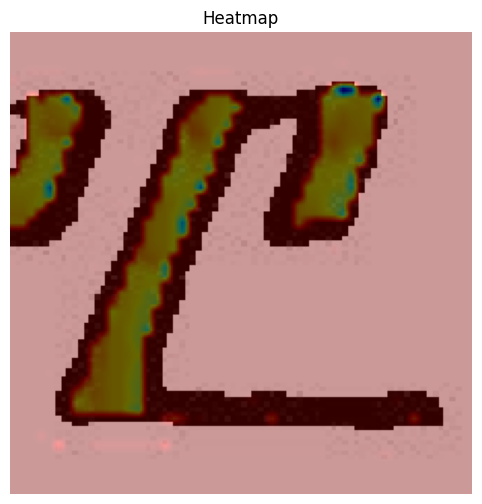

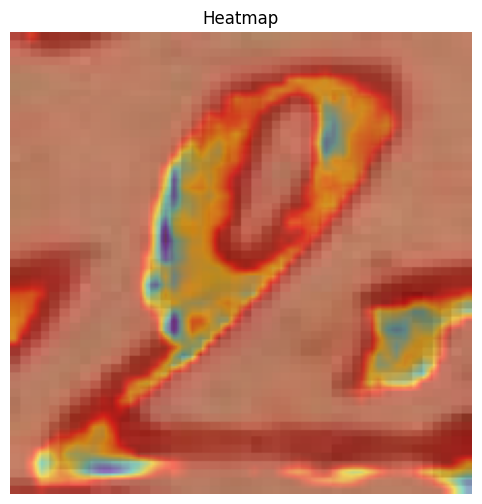

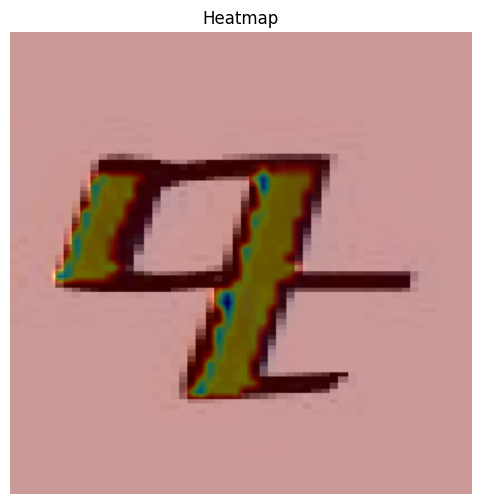

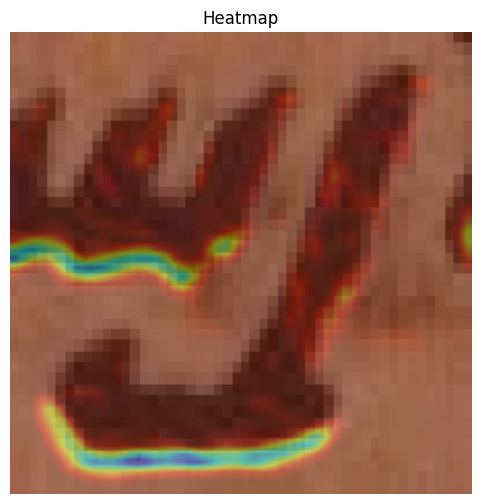

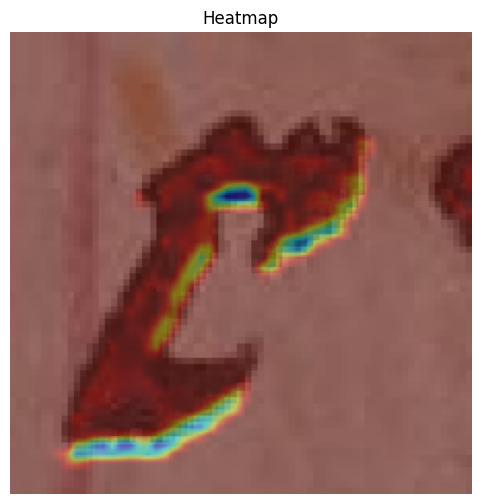

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import cv2


def load_images_with_labels(folder_path, target_size=(224, 224)):
    image_list = []
    labels = []
    class_names = []

    for class_folder in os.listdir(folder_path):
        class_path = os.path.join(folder_path, class_folder)
        if os.path.isdir(class_path):
            class_names.append(class_folder)
            for file in os.listdir(class_path):
                if file.lower().endswith(('png', 'jpg', 'jpeg')):
                    img_path = os.path.join(class_path, file)
                    img = image.load_img(img_path, target_size=target_size)
                    img_array = image.img_to_array(img) / 255.0
                    image_list.append(img_array)
                    labels.append(class_folder)

    return np.array(image_list), np.array(labels), class_names


def build_custom_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape, name='conv1'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', name='conv2'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', name='conv3'),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation='relu', name='dense1'),
        layers.Dense(num_classes, activation='softmax', name='output')
    ])

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model



def visualize_focus(model, img_array, target_size=(224, 224)):
    last_conv_layer_name = 'conv3'
    grad_model = Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    img_array_expanded = np.expand_dims(img_array, axis=0)

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array_expanded)
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)

    if grads is not None:
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        conv_outputs = conv_outputs * pooled_grads

        heatmap = tf.reduce_mean(conv_outputs, axis=-1).numpy()
        heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

        img = np.uint8(255 * img_array)
        heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

        plt.figure(figsize=(8, 6))
        plt.imshow(superimposed_img)
        plt.axis("off")
        plt.title("Heatmap")
        plt.show()

# --- Main Execution ---
folder_path = "/home/cvidalgo/Documents/cours/PaleoComput/20-02-2025/data_classif_cours"

images, labels, class_names = load_images_with_labels(folder_path)
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

X_train, X_test, y_train, y_test = train_test_split(images, labels_encoded, test_size=0.2, random_state=42)

input_shape = X_train.shape[1:]
num_classes = len(class_names)

model = build_custom_cnn(input_shape, num_classes)
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

print("\nClassification Report:\n", classification_report(y_test, np.argmax(model.predict(X_test), axis=1)))

for img in X_test[:5]:
    visualize_focus(model, img)


In [7]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x


def visualize_filter_patterns(model, layer_name, img_width=224, img_height=224, n=5, steps=40, step_size=1.0):
    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    n_filters = intermediate_model.output.shape[-1]
    kept_filters = []

    for filter_index in range(min(n * n, n_filters)):
        print(f'Processing filter {filter_index}')
        input_img_data = tf.Variable(np.random.random((1, img_width, img_height, 3)) * 20 + 128.)

        for _ in range(steps):
            with tf.GradientTape() as tape:
                tape.watch(input_img_data)
                activation = intermediate_model(input_img_data)
                if len(activation.shape) == 4:
                    loss = tf.reduce_mean(activation[:, :, :, filter_index])
                else:
                    loss = tf.reduce_mean(activation[:, filter_index])

            grads = tape.gradient(loss, input_img_data)
            grads /= (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)
            input_img_data.assign_add(grads * step_size)

        img = deprocess_image(input_img_data.numpy()[0])
        kept_filters.append(img)

    margin = 5
    width = n * img_width + (n - 1) * margin
    height = n * img_height + (n - 1) * margin
    stitched_filters = np.zeros((width, height, 3))

    for i in range(n):
        for j in range(n):
            if i * n + j < len(kept_filters):
                img = kept_filters[i * n + j]
                stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                                 (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

    plt.figure(figsize=(20, 20))
    plt.imshow(stitched_filters.astype('uint8'))
    plt.title(f'Meaningful patterns in layer: {layer_name}', fontsize=18)
    plt.axis('off')
    plt.show()

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24


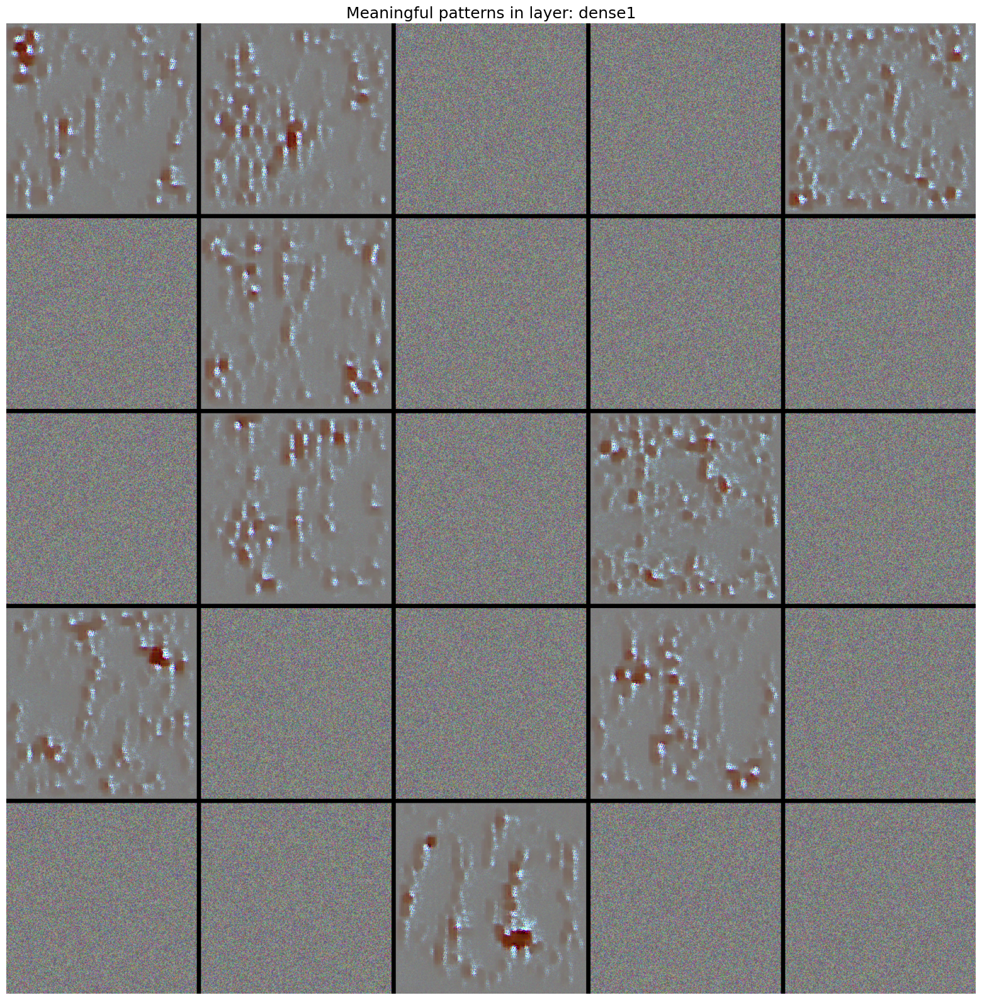

In [8]:
visualize_filter_patterns(model, 'dense1')

In [87]:
vgg_model = VGG16(weights='imagenet', include_top=False)
print("\nList of VGG16 layers:")
for i, layer in enumerate(vgg_model.layers):
    print(f"{i}: {layer.name} - {layer.output_shape}")


List of VGG16 layers:
0: input_9 - [(None, None, None, 3)]
1: block1_conv1 - (None, None, None, 64)
2: block1_conv2 - (None, None, None, 64)
3: block1_pool - (None, None, None, 64)
4: block2_conv1 - (None, None, None, 128)
5: block2_conv2 - (None, None, None, 128)
6: block2_pool - (None, None, None, 128)
7: block3_conv1 - (None, None, None, 256)
8: block3_conv2 - (None, None, None, 256)
9: block3_conv3 - (None, None, None, 256)
10: block3_pool - (None, None, None, 256)
11: block4_conv1 - (None, None, None, 512)
12: block4_conv2 - (None, None, None, 512)
13: block4_conv3 - (None, None, None, 512)
14: block4_pool - (None, None, None, 512)
15: block5_conv1 - (None, None, None, 512)
16: block5_conv2 - (None, None, None, 512)
17: block5_conv3 - (None, None, None, 512)
18: block5_pool - (None, None, None, 512)


Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24


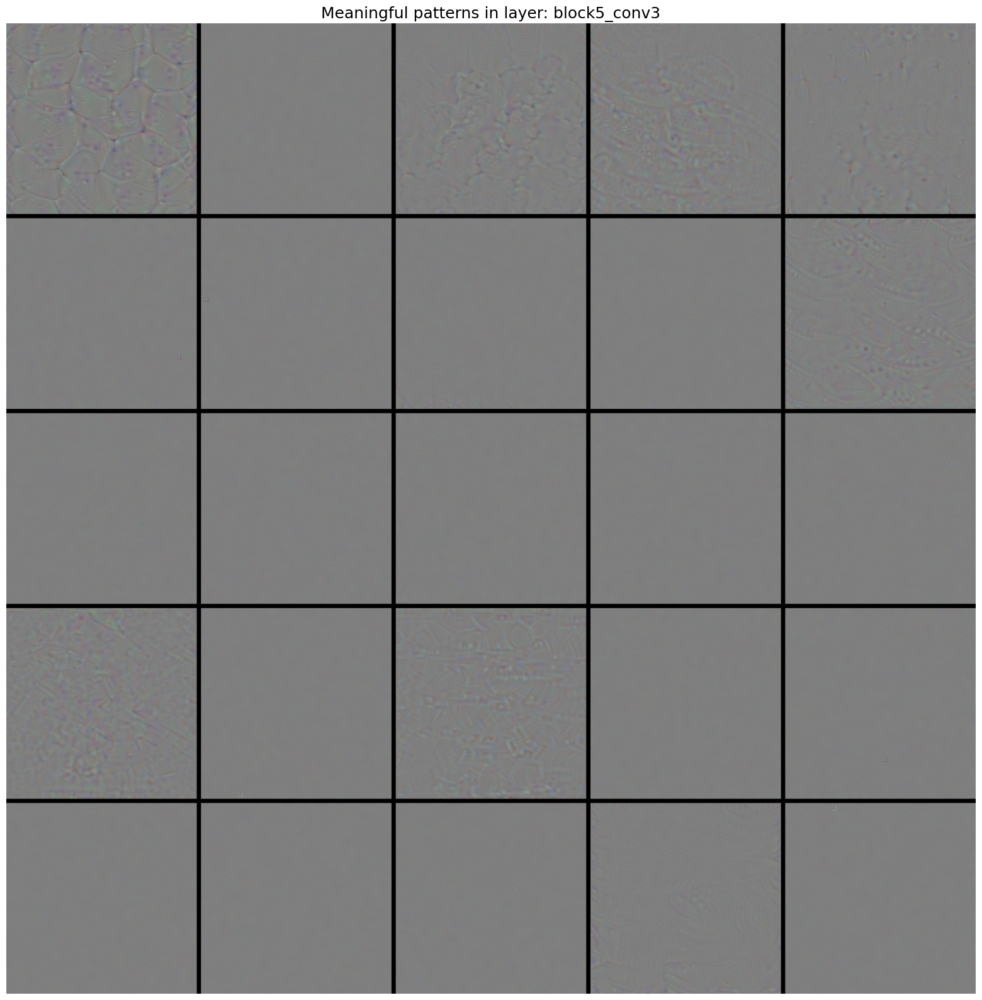

In [89]:
visualize_filter_patterns(vgg_model, 'block5_conv3')

In [ ]:
def plot_scatter(features_2d, labels):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='tab10', alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()
    
def plot_scatter_with_images(features_2d, image_paths, zoom=0.1):
    fig, ax = plt.subplots(figsize=(15, 10))
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.scatter(features_2d[:, 0], features_2d[:, 1], alpha=0)

    for xy, img_path in zip(features_2d, image_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (150, 150))
        imagebox = OffsetImage(img, zoom=zoom)
        ab = AnnotationBbox(imagebox, xy, frameon=False)
        ax.add_artist(ab)

    plt.show()
